In [ ]:
# Montar Google Drive y darle acceso
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
!pip install plantcv #instalar librería plantcv

In [ ]:
#agregar la ruta de la carpeta donde se encuentran las imagenes
import os
ruta_carpeta = "/content/gdrive/MyDrive/Big data  /Trabajo final/ds/img"
archivos = os.listdir(ruta_carpeta)

# Filtramos para asegurarnos de que solo leemos imágenes
imagenes = [f for f in archivos if f.endswith(('.png', '.jpg', '.jpeg'))]

for nombre_archivo in imagenes:
    ruta_completa = os.path.join(ruta_carpeta, nombre_archivo)
    print(f"Ruta lista: {ruta_completa}")

Ruta lista: /content/gdrive/MyDrive/Big data  /Trabajo final/ds/img/plant-1_task-6603_sv270_cabin-2.png
Ruta lista: /content/gdrive/MyDrive/Big data  /Trabajo final/ds/img/plant-1_task-6715_sv180_cabin-2.png
Ruta lista: /content/gdrive/MyDrive/Big data  /Trabajo final/ds/img/plant-1_task-6856_sv210_cabin-1.png
Ruta lista: /content/gdrive/MyDrive/Big data  /Trabajo final/ds/img/plant-1_task-6861_sv300_cabin-1.png
Ruta lista: /content/gdrive/MyDrive/Big data  /Trabajo final/ds/img/plant-1_task-6883_sv270_cabin-1.png
Ruta lista: /content/gdrive/MyDrive/Big data  /Trabajo final/ds/img/plant-1_task-6899_sv270_cabin-1.png
Ruta lista: /content/gdrive/MyDrive/Big data  /Trabajo final/ds/img/plant-1_task-6904_sv90_cabin-1.png
Ruta lista: /content/gdrive/MyDrive/Big data  /Trabajo final/ds/img/plant-1_task-6912_tv0_cabin-1.png


In [ ]:
#leer las imagenes
from matplotlib.image import imread
img_numpy = imread(ruta_completa)

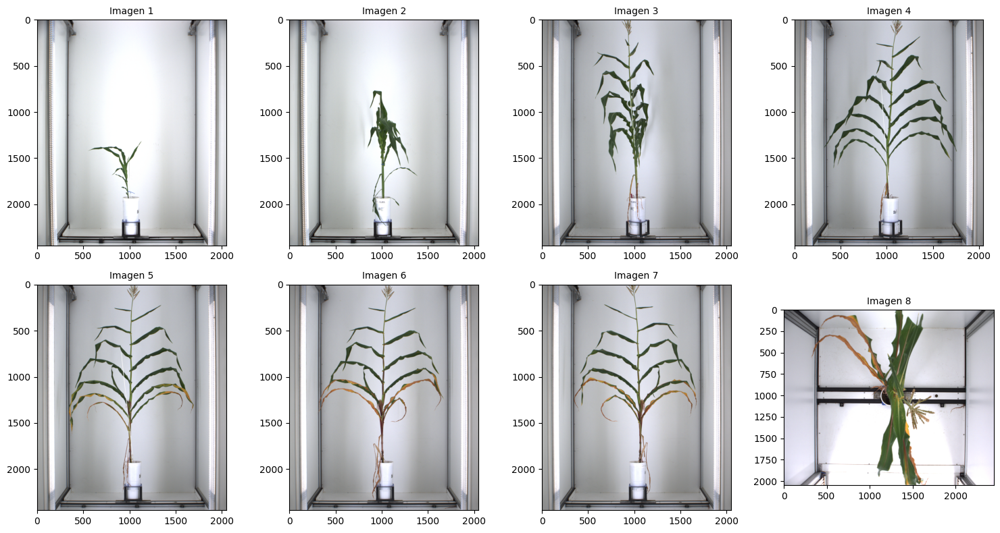

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
#Definir la lista de rutas completas
lista_rutas_completas_imagenes = [os.path.join(ruta_carpeta, img_name) for img_name in imagenes]

# Configuración del tamaño de la figura que se va a plotear
plt.figure(figsize=(15, 8))

for i, ruta in enumerate(lista_rutas_completas_imagenes):
    #disposición de las imagenes
    if i >= 8:
        break

    plt.subplot(2, 4, i + 1)

    # Lectura y ploteo de las imagenes
    img = mpimg.imread(ruta)
    plt.imshow(img)

    # Parametros de visualización
    plt.title(f"Imagen {i+1}", fontsize=10)

plt.tight_layout() # Ajuste del espacio entre imagenes
plt.show()

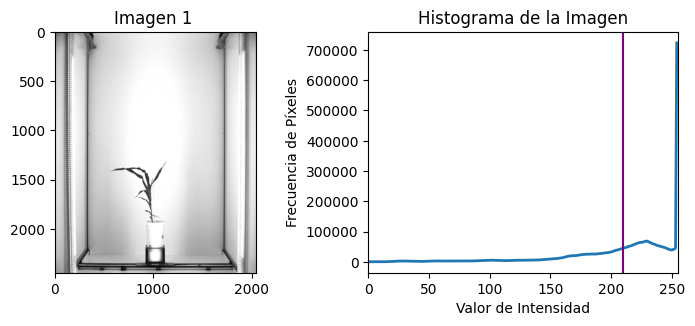

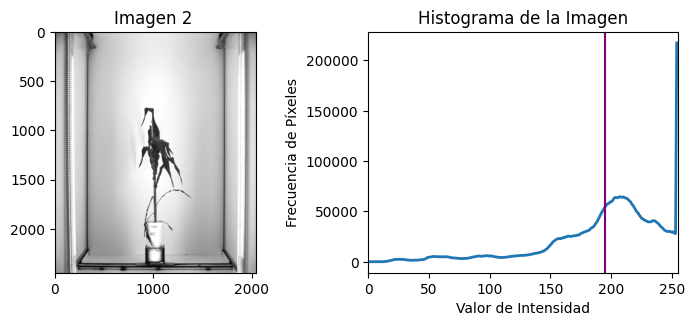

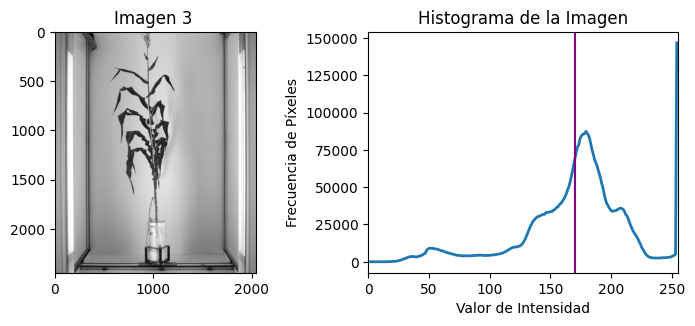

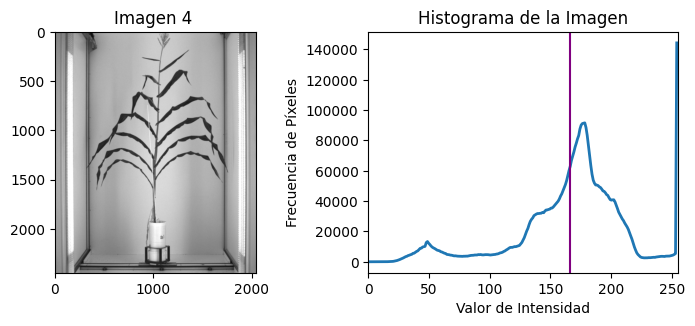

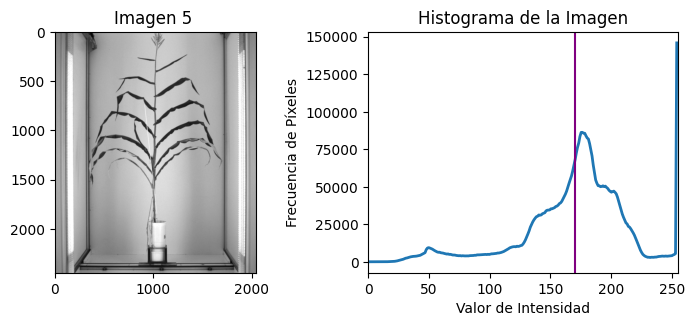

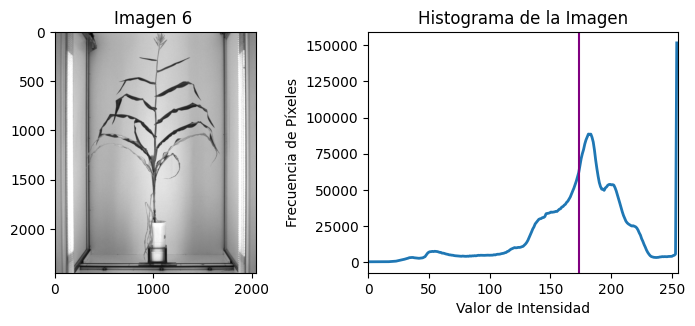

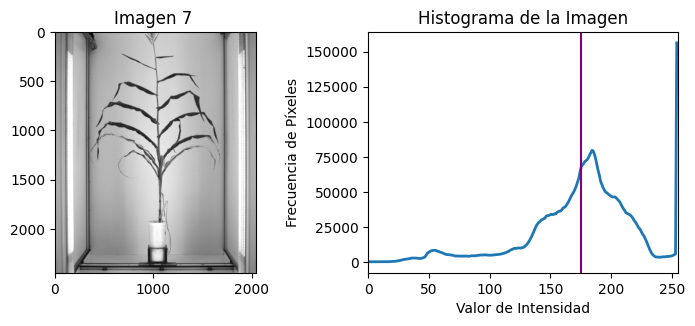

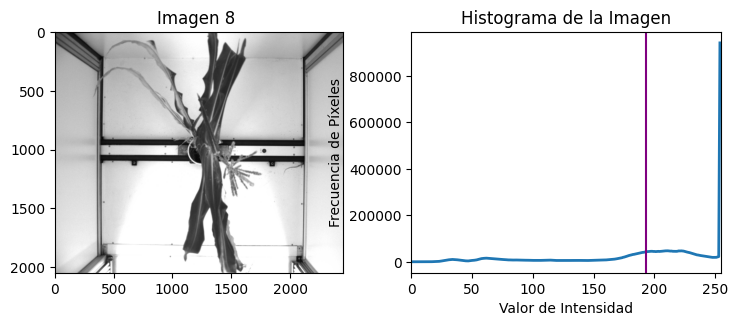

In [ ]:
#Generación del histograma para cada imagen
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

for i, ruta in enumerate(lista_rutas_completas_imagenes):
    if i >= 8:
        break

    img_numpy = mpimg.imread(ruta)

  #Valores entre 0-255 por el tipo de imagen
#Uso de la banda roja de RGB
    if img_numpy.dtype != np.uint8 and img_numpy.max() <= 1.0:
        Banda = (img_numpy[..., 0] * 255).astype(np.uint8)
    else:
        Banda = img_numpy[..., 0]
#Código base de la clase para generar el histoograma normalizado
    frecuencia, valor = np.histogram(Banda, bins=256, range=(0, 255))

    fig, axes = plt.subplots(1, 2, figsize=(2.5*3, 3))
    plt.tight_layout()

    # Ploteo del histograma de cada imagen para la banda roja
    axes[0].imshow(Banda, cmap="grey")
    axes[0].set_title(f"Imagen {i+1} ")

    # Ploteo del histograma calculado anteriormente
    axes[1].plot(valor[:-1], frecuencia, lw=2)
    axes[1].set_title("Histograma de la Imagen")
    axes[1].set_xlabel("Valor de Intensidad")
    axes[1].set_ylabel("Frecuencia de Píxeles")

    #Ejes
    axes[1].set_xlim(0, 255)

    # Trazar línea vertical en la media
    axes[1].axvline(np.mean(Banda), color='purple', linestyle='-')

    plt.show()

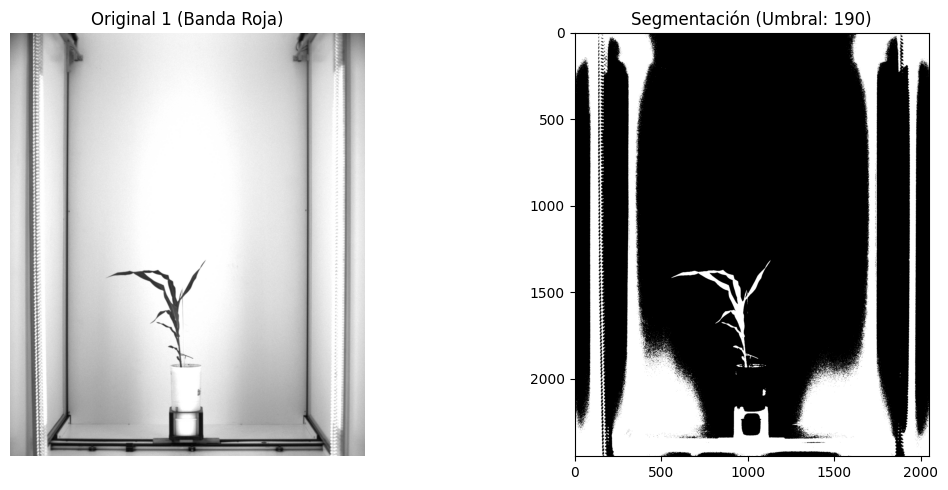

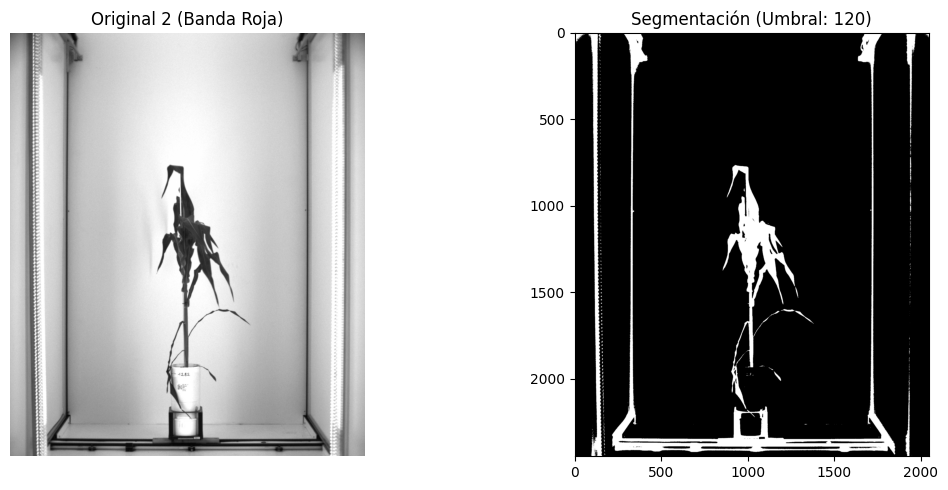

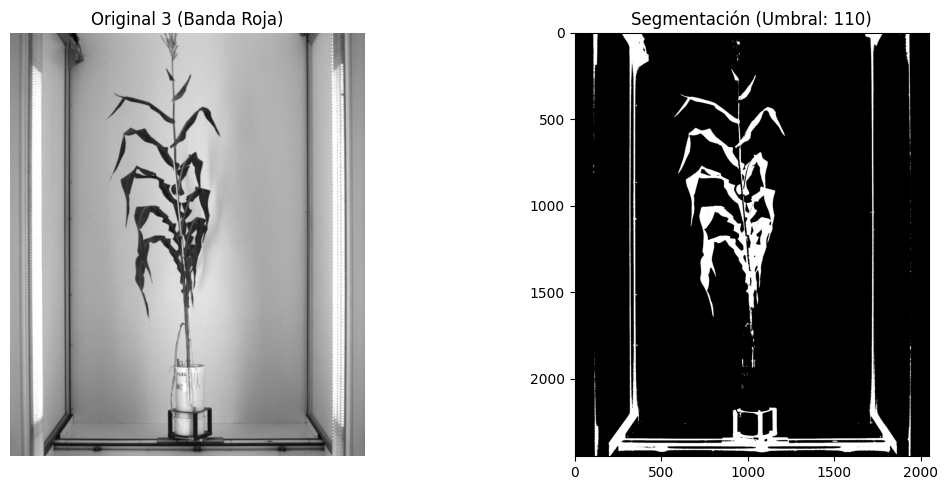

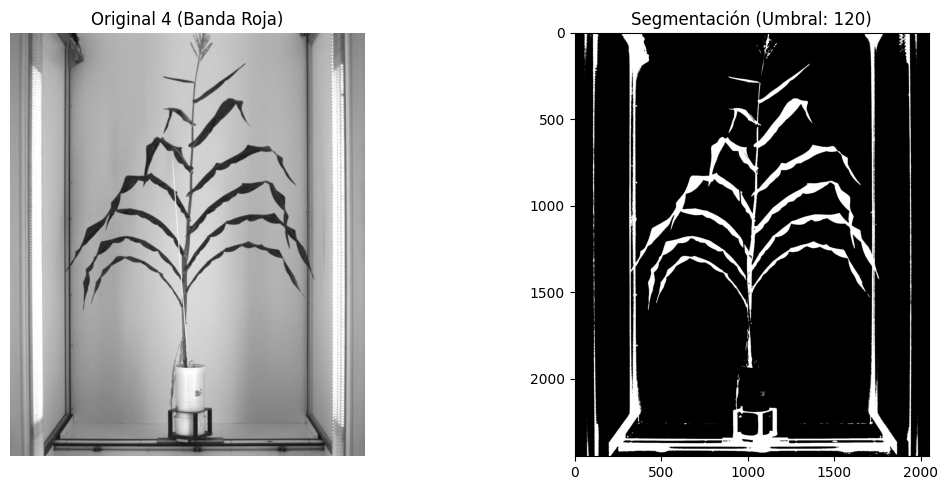

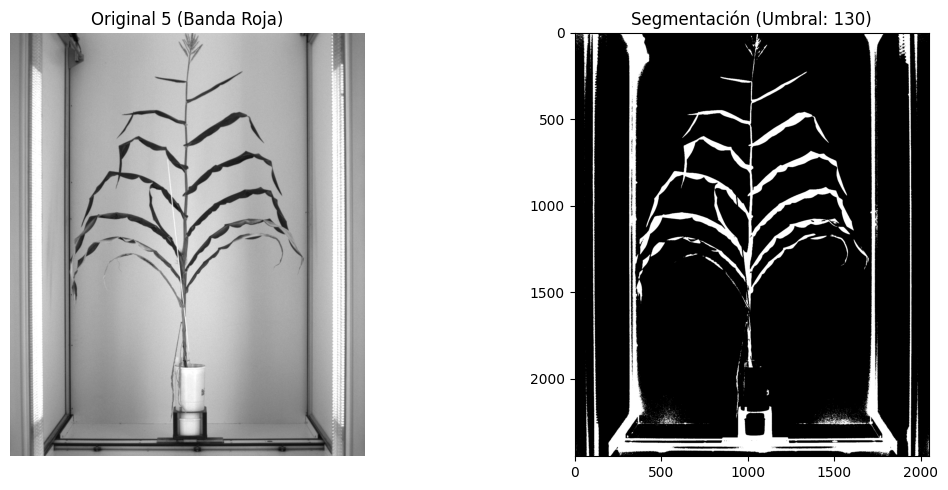

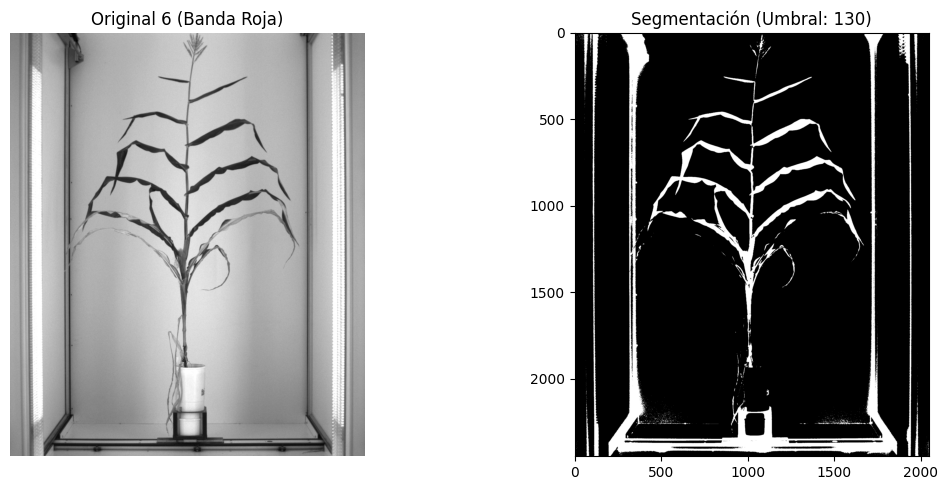

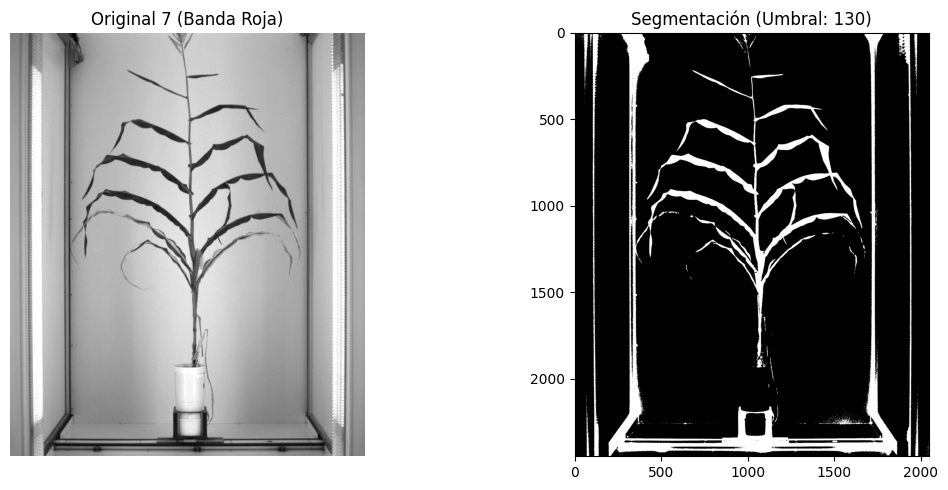

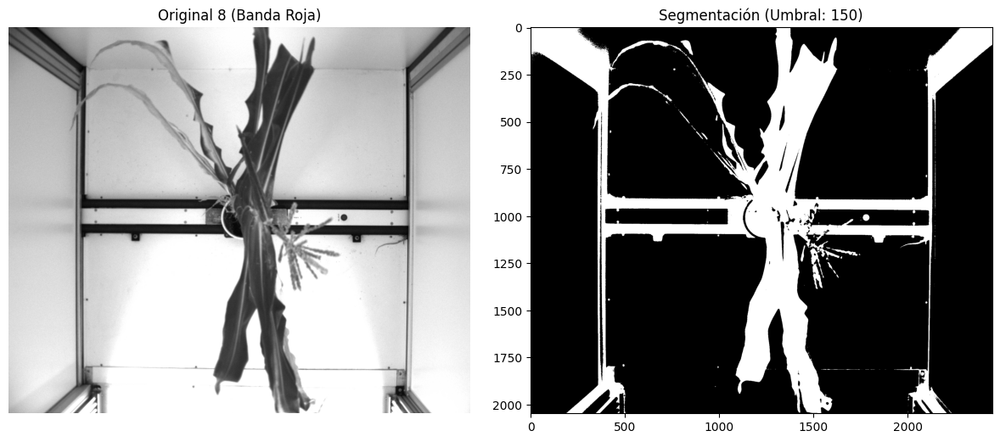

In [ ]:
#Segmentación
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg #necesario para la traduccion de los formatos. Ayuda a leer las imagenes que están dentro de una misma carpeta

#Definición de los umbrales para cada una de las imagenes
umbrales = [190, 120, 110, 120, 130, 130, 130, 150]

for i, ruta in enumerate(lista_rutas_completas_imagenes):
    if i >= 8:
        break

    # Carga de imagenes y recordar que es la banda roja
    img_numpy = mpimg.imread(ruta)

    #Asegurar que el rango sea de 0-255
    if img_numpy.max() <= 1.0:
        Banda = (img_numpy[..., 0] * 255).astype(np.uint8)
    else:
        Banda = img_numpy[..., 0]

    # Estructura base del código de clase
    umbral = umbrales[i]  # Selecciona el umbral correspondiente a la imagen actual, es decir, con la que trabaja en el momento

    # Segmentación: donde el valor es mayor al umbral asigna 0, si no 1
    seg_manual = np.where(Banda > umbral, 0, 1)

    # Visualización
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    #Ploteo de la banda roja original para comparar la segmentación
    axes[0].imshow(Banda, cmap='gray')
    axes[0].set_title(f"Original {i+1} (Banda Roja)")
    axes[0].axis('off')

    # Ploteo de la segmentación
    axes[1].imshow(seg_manual, cmap='gray')
    axes[1].set_title(f"Segmentación (Umbral: {umbral})")

    plt.tight_layout()
    plt.show()

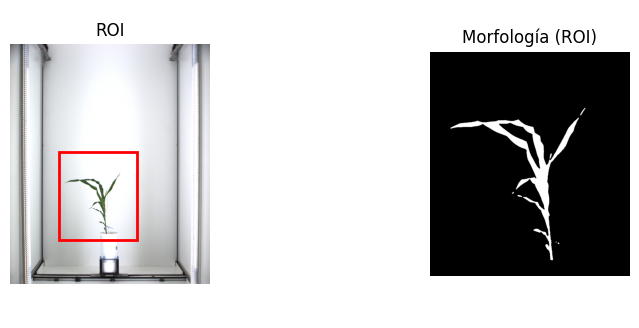

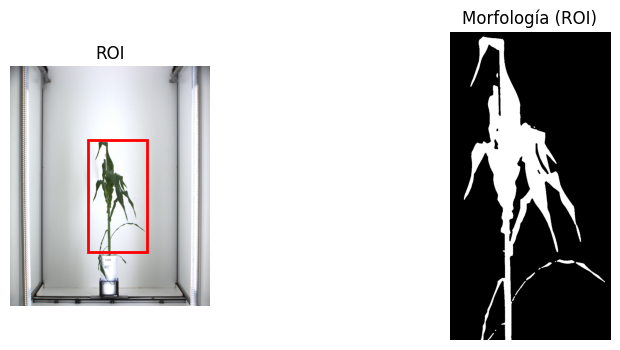

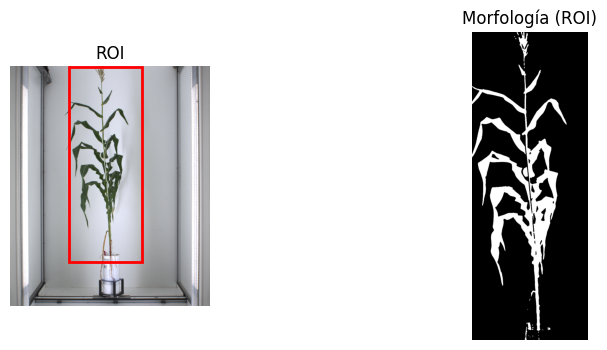

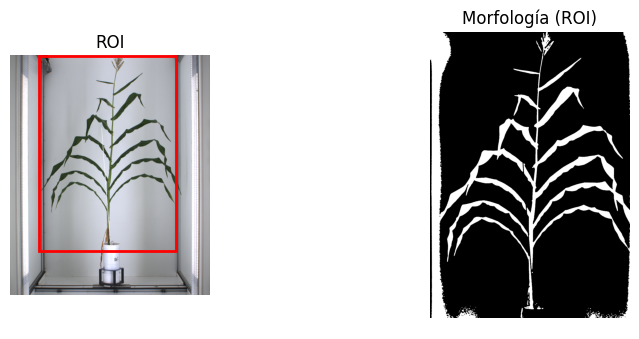

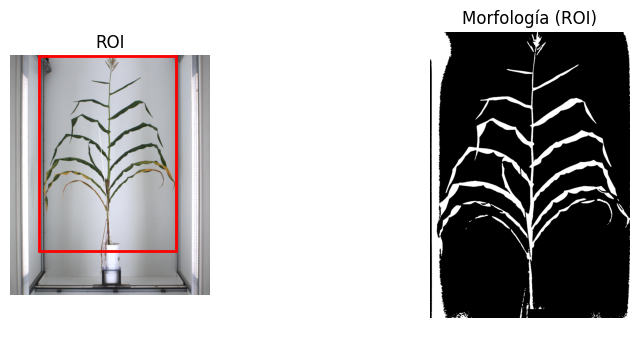

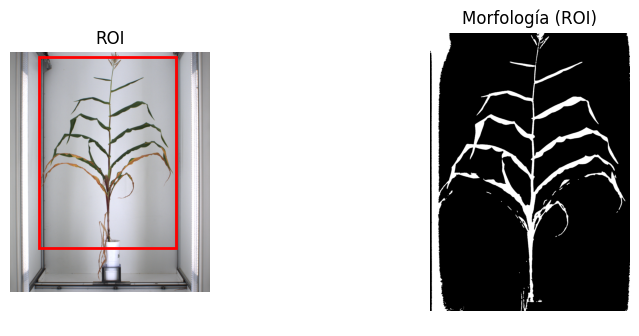

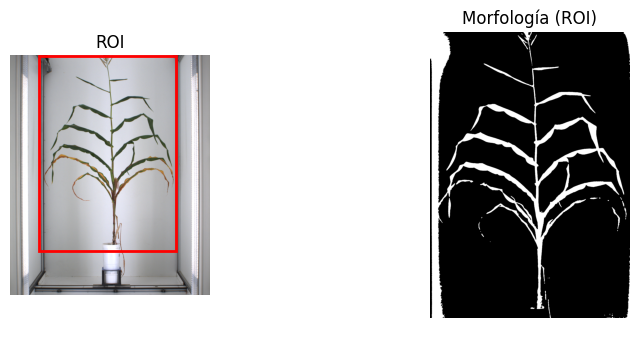

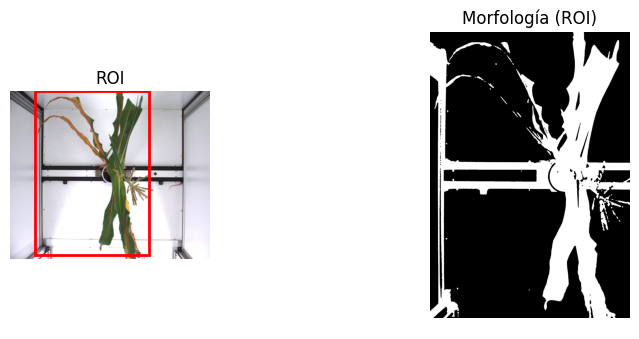

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.image import imread
from skimage.color import rgba2rgb
from skimage.morphology import disk, binary_erosion, binary_dilation, binary_opening, binary_closing
import numpy as np

# Establecimiento del ROI independiente para cada imagen
# Significado de cada numero (y_min, y_max, x_min, x_max)
rois_config = [
    (1100, 2000, 500, 1300),
    (750, 1900, 800, 1400),
    (0,  2000, 600, 1350),
    (0,  2000, 300, 1700),
    (0,  2000, 300, 1700),
    (50,  2000, 300, 1700),
    (0,  2000, 300, 1700),
   (0,  2000, 300, 1700),
    (0,  2000, 300, 1600)
]

# Inicio de la lista de ROIs
segmentaciones_roi = []

for i, ruta in enumerate(lista_rutas_completas_imagenes):
    try:
        img_raw = imread(ruta)
        if img_raw.ndim == 3 and img_raw.shape[-1] == 4:
            img_raw = rgba2rgb(img_raw)

        # Extracción de ROIs
        y_min, y_max, x_min, x_max = rois_config[i] # Esta línea asigna los valores
        img_roi = img_raw[y_min:y_max, x_min:x_max]

        # Procesamiento  de la Banda Roja + Segmentación
        Banda = img_roi[..., 0]
        if Banda.max() <= 1.0: Banda = (Banda * 255).astype(np.uint8)
        imagen_segmentada = np.where(Banda > umbral, 0, 1)

        # Aplicación de operaciones morfológicas
        elemento_estructurante = disk(2)
        erosion = binary_erosion(imagen_segmentada, elemento_estructurante)
        dilatacion = binary_dilation(erosion, elemento_estructurante)
        apertura = binary_opening(imagen_segmentada, elemento_estructurante)
        cierre = binary_closing(apertura, elemento_estructurante)

        segmentaciones_roi.append(cierre)

        # Ploteo de resultados

        fig, axes = plt.subplots(1, 3, figsize=(8, 4)) # Bajamos el ancho de 10 a 8
        plt.subplots_adjust(wspace=0.05) # Este parámetro junta las imágenes (casi sin espacio)

        #Mostrar la imagen original con el área del ROI marcada
        axes[0].imshow(img_raw)
        rect = plt.Rectangle((x_min, y_min), x_max-x_min, y_max-y_min,
                             linewidth=2, edgecolor='r', facecolor='none')
        axes[0].add_patch(rect)
        axes[0].set_title(f"ROI")

        # Mostrar la morfología final dentro de ese ROI
        axes[2].imshow(cierre, cmap='gray')
        axes[2].set_title("Morfología (ROI)")


        for ax in axes: ax.axis('off')
        plt.show()

    except Exception as e:
        print(f"Error en imagen {i+1}: {e}")

Generando esqueletos para 8 imágenes...


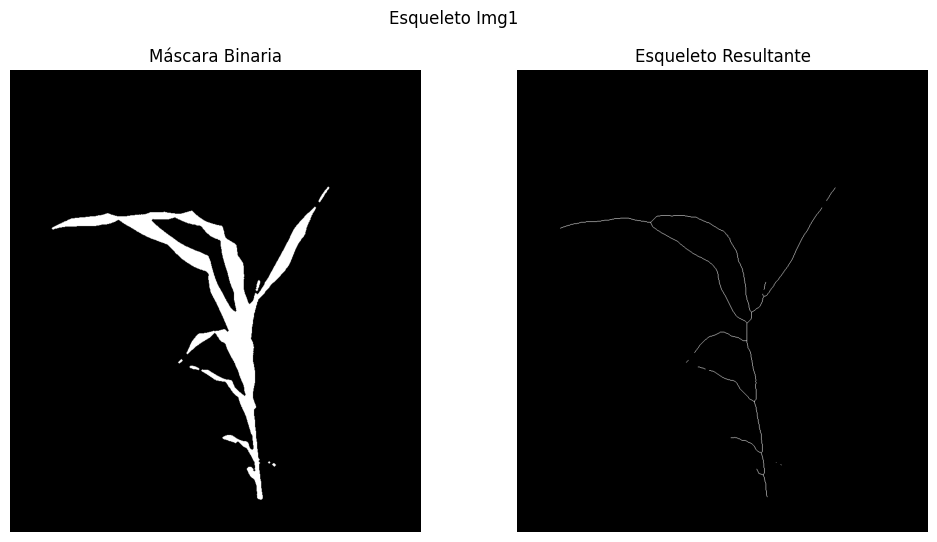

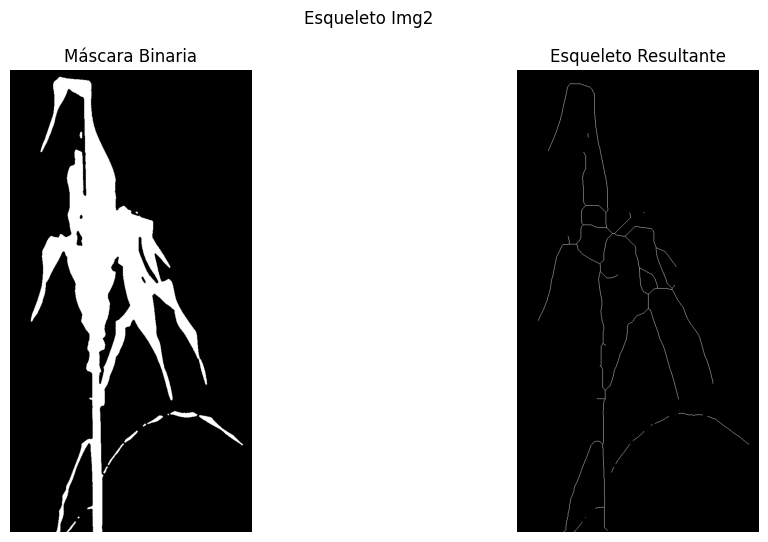

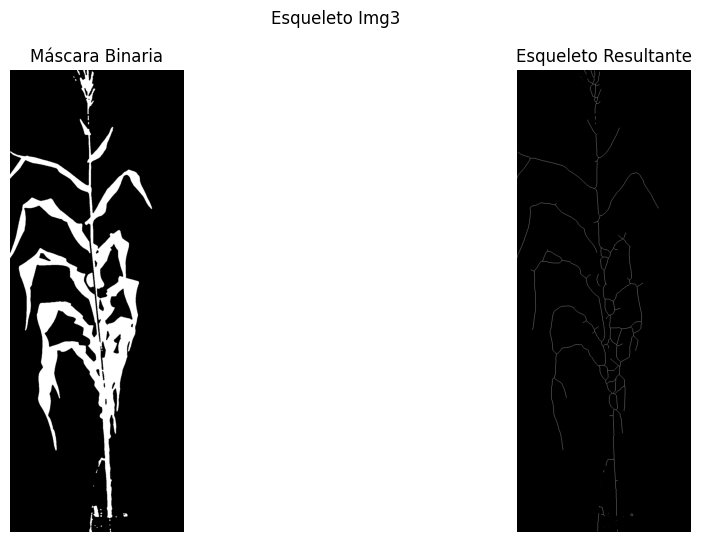

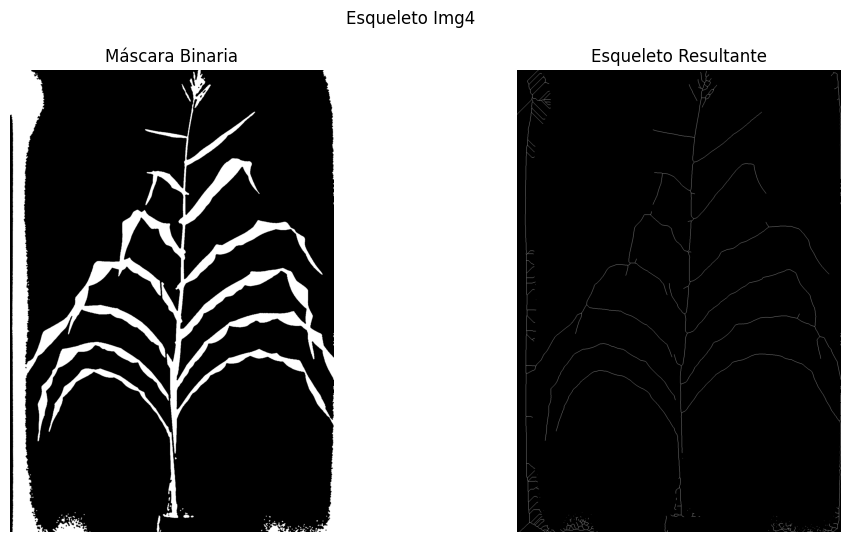

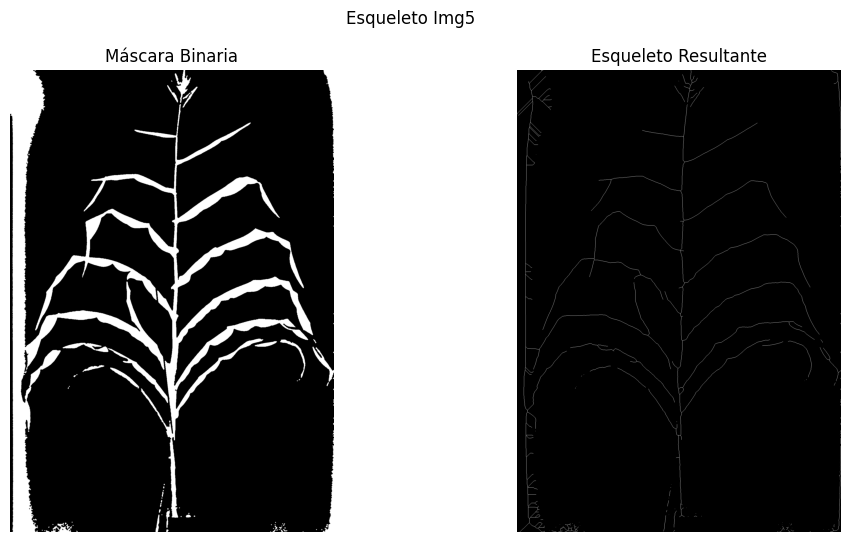

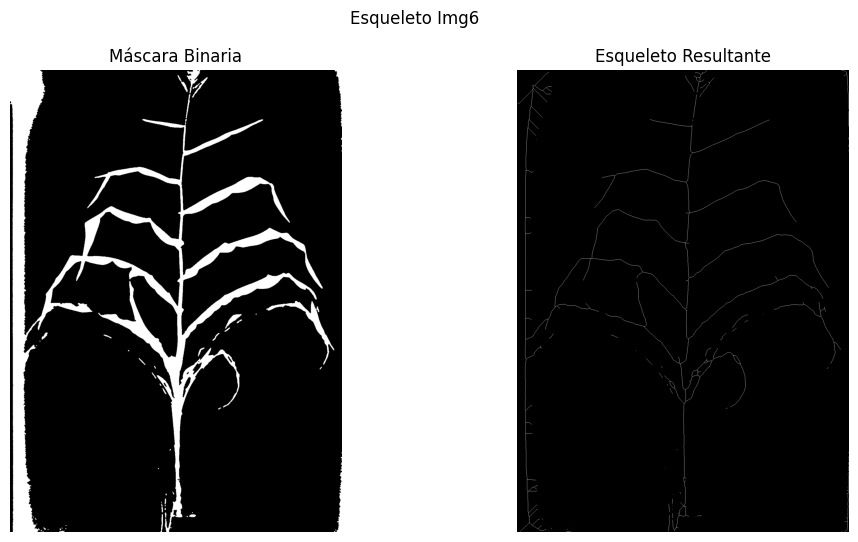

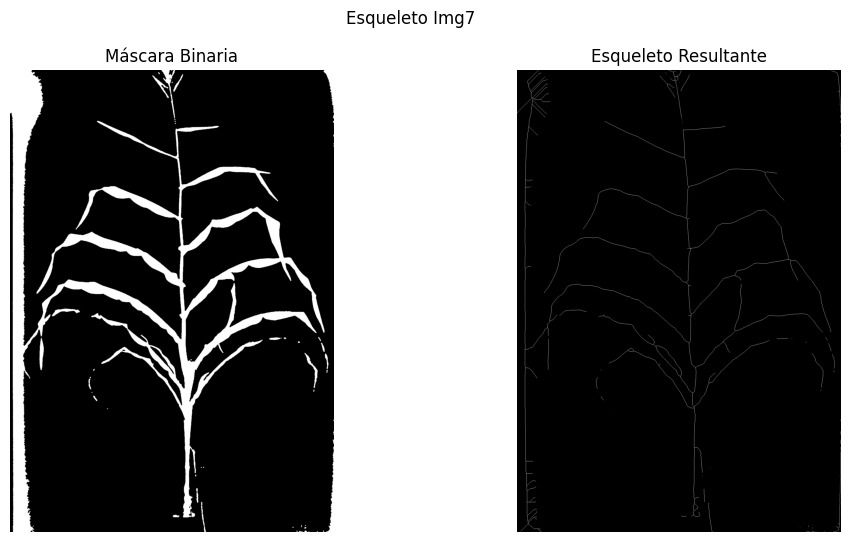

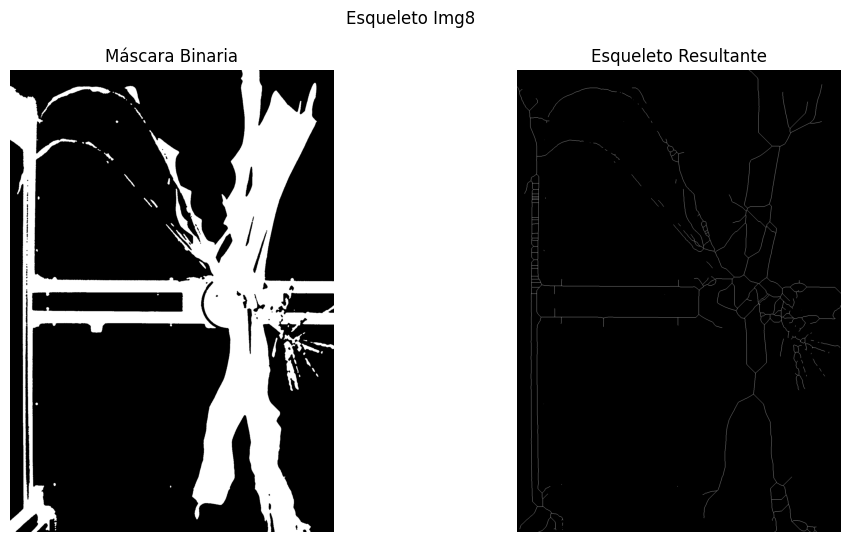

--- Proceso completado: 8 esqueletos listos ---


In [ ]:
#Generar esqueletos
from plantcv import plantcv as pcv
import matplotlib.pyplot as plt
import numpy as np

# Lista para almacenar los esqueletos resultantes
esqueletos = []

print(f"Generando esqueletos para {len(segmentaciones_roi)} imágenes...")

for i, mascara_limpia in enumerate(segmentaciones_roi):
    try:
        # PREPARACIÓN DE LA MÁSCARA
        # Converción de Booleano/Float a Entero de 8 bits (0 y 255)

        mask_for_pcv = mascara_limpia.astype(np.uint8)
        if mask_for_pcv.max() == 1:
            mask_for_pcv *= 255

        # Esqueleto
        # Esta función reduce la planta a una línea de 1 píxel de ancho
        skeleton = pcv.morphology.skeletonize(mask=mask_for_pcv)

        # Se guarda en la lista para el paso de poda del esqueleto
        esqueletos.append(skeleton)

        #Visualización
        fig, axes = plt.subplots(1, 2, figsize=(12, 6))
        fig.suptitle(f"Esqueleto Img{i+1}")

        axes[0].imshow(mascara_limpia, cmap='gray')
        axes[0].set_title("Máscara Binaria")

        axes[1].imshow(skeleton, cmap='gray')
        axes[1].set_title("Esqueleto Resultante")

        for ax in axes: ax.axis('off')
        plt.show()

    except Exception as e:
        print(f"Error al generar esqueleto en imagen {i+1}: {e}")

print(f"--- Proceso completado: {len(esqueletos)} esqueletos listos ---")

Podando esqueletos para 8 imágenes...


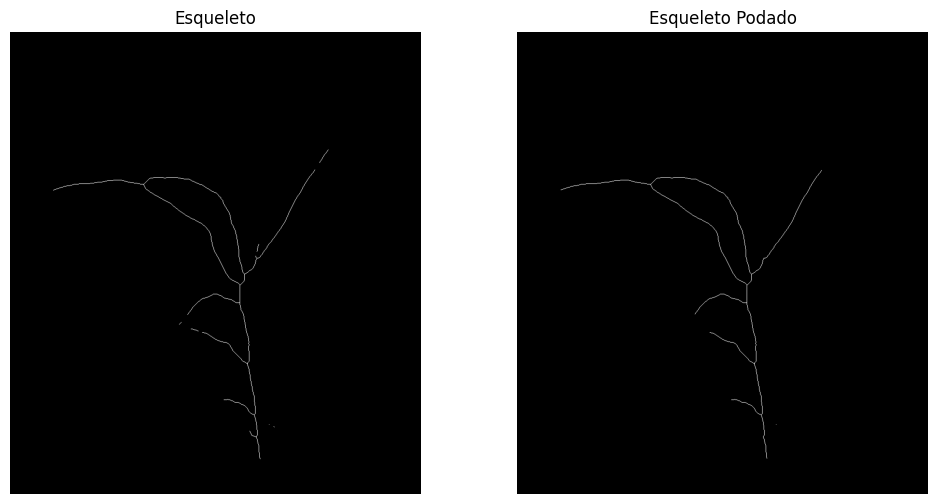

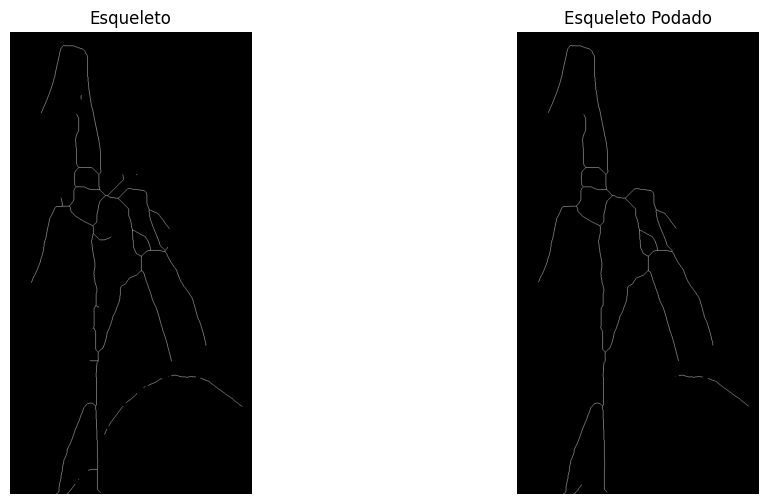

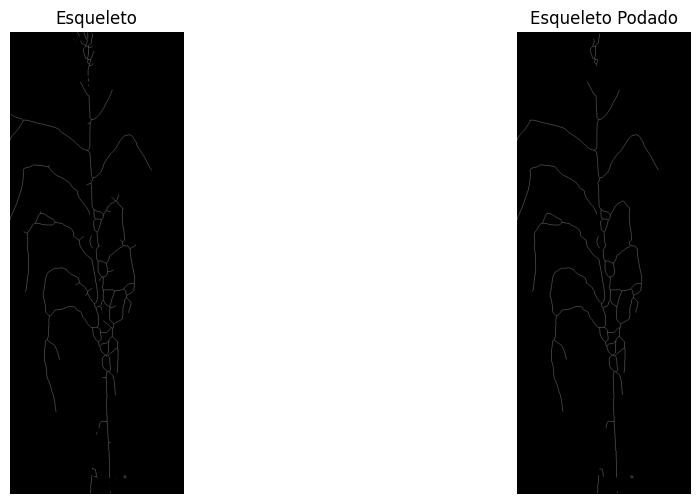

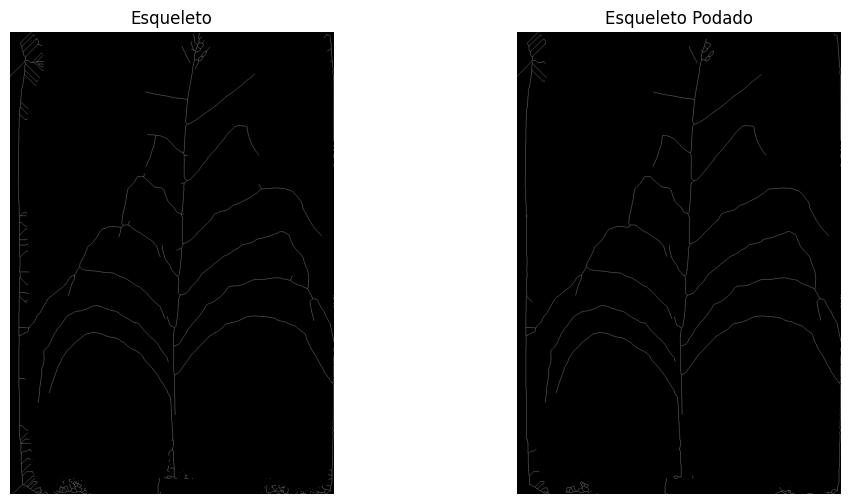

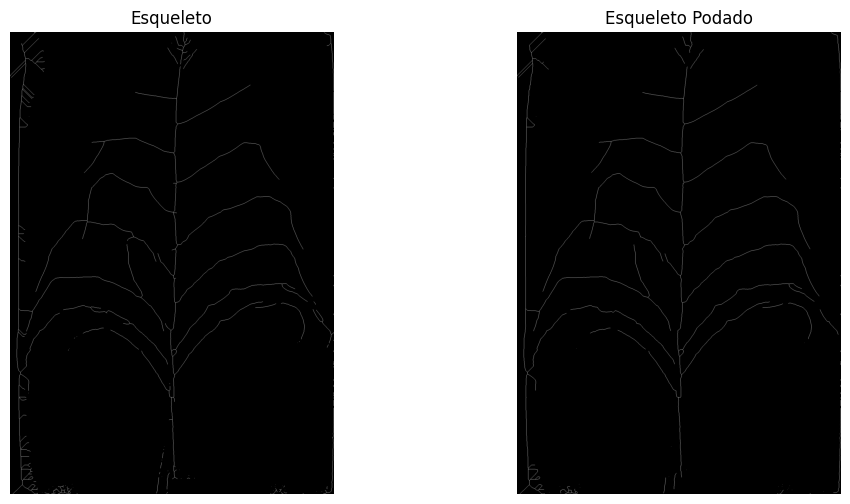

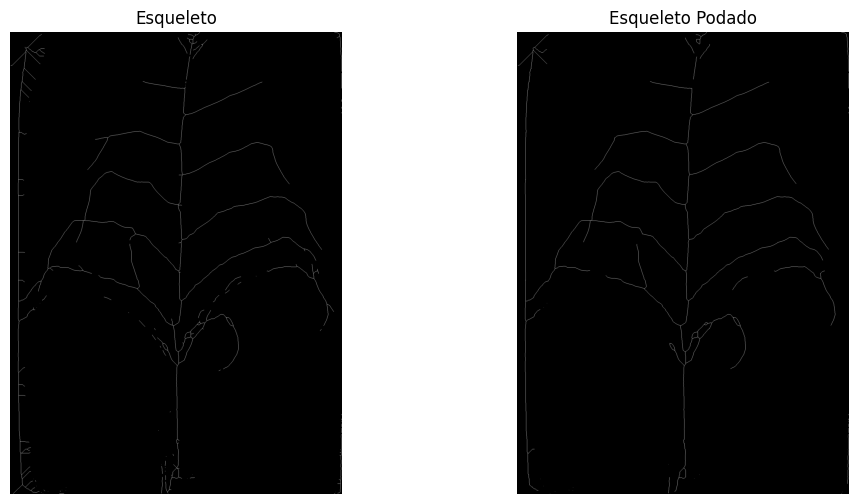

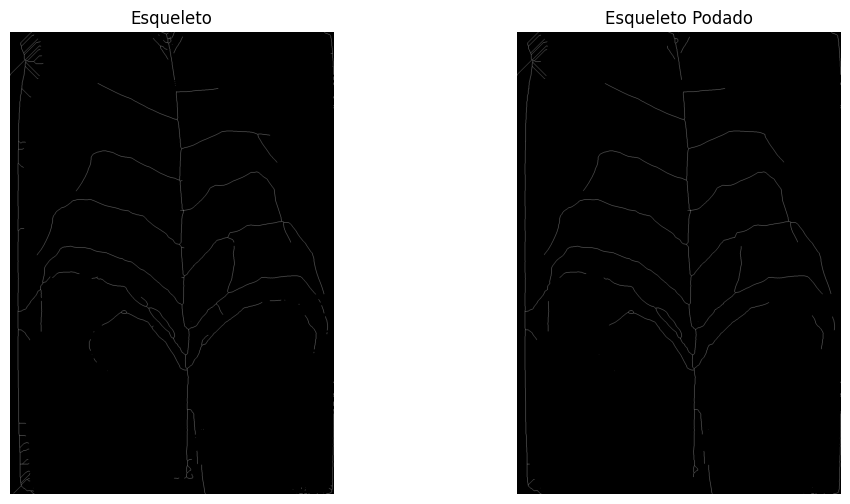

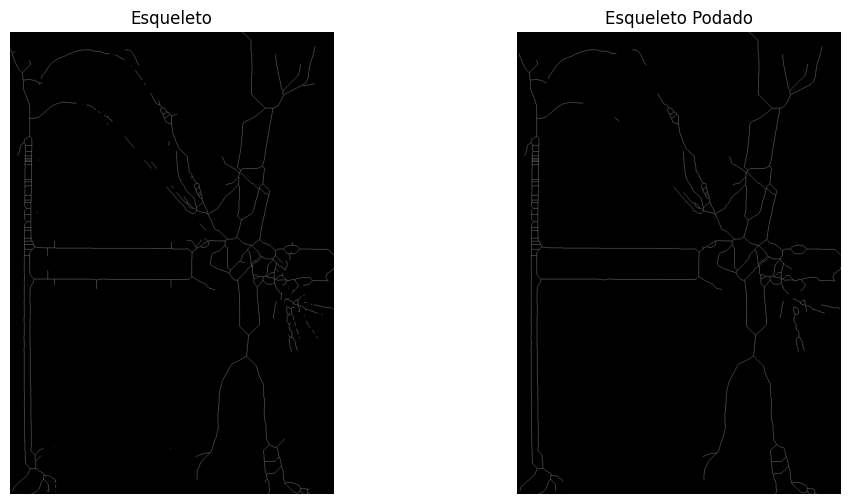

--- Poda completada con éxito ---


In [ ]:
#Poda del esqueleto
from plantcv import plantcv as pcv
import matplotlib.pyplot as plt
import numpy as np

# Listas para guardar los resultados de la poda
esqueletos_podados = []
objetos_segmentos = [] # Aquí guardamos 'edge_objects' para el paso de clasificación

print(f"Podando esqueletos para {len(esqueletos)} imágenes...")

for i, skel in enumerate(esqueletos):
    try:

        # Usamos la máscara que resultó con segmentaciones_roi
        mask_pcv = segmentaciones_roi[i].astype(np.uint8)
        if mask_pcv.max() == 1: mask_pcv *= 255

        skel_pcv = skel.astype(np.uint8)
        if skel_pcv.max() == 1: skel_pcv *= 255

        # Aplicación de poda
        # skel_img: El esqueleto original
        # size: Longitud mínima de rama (en px). Ramas más cortas se eliminan.
        # mask: La máscara de la planta como referencia.
        pruned_skel, seg_img, edge_objects = pcv.morphology.prune(
            skel_img=skel_pcv,
            size=100,
            mask=mask_pcv
        )

        # Guardar los resultados
        esqueletos_podados.append(pruned_skel)
        objetos_segmentos.append(edge_objects) # Vital para el segment_sort después

        #Visualización
        fig, axes = plt.subplots(1, 2, figsize=(12, 6))

        axes[0].imshow(skel, cmap='gray')
        axes[0].set_title("Esqueleto")

        axes[1].imshow(pruned_skel, cmap='gray')
        axes[1].set_title("Esqueleto Podado")

        for ax in axes: ax.axis('off')
        plt.show()

    except Exception as e:
        print(f"Error al podar imagen {i+1}: {e}")

print("--- Poda completada con éxito ---")

Iniciando análisis multiobjeto en 8 imágenes...
Imagen 1: 7 hojas detectadas.


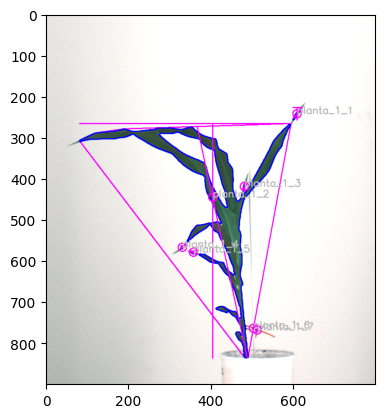

Imagen 2: 13 hojas detectadas.


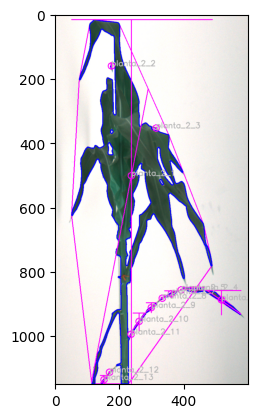

Imagen 3: 25 hojas detectadas.


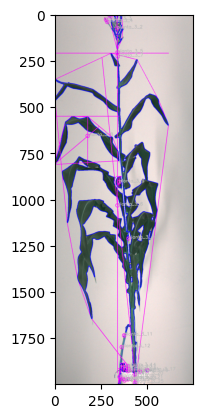

Imagen 4: 91 hojas detectadas.


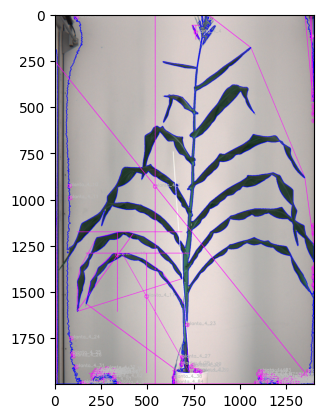

Imagen 5: 96 hojas detectadas.


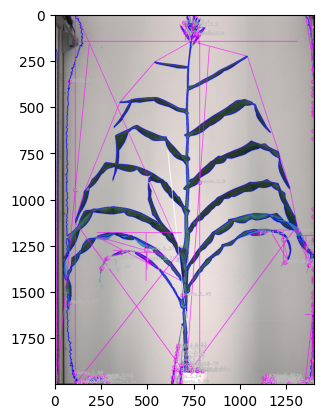

Imagen 6: 67 hojas detectadas.


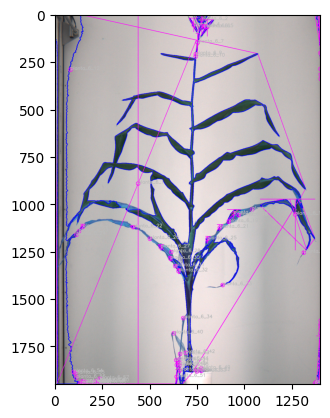

Imagen 7: 57 hojas detectadas.


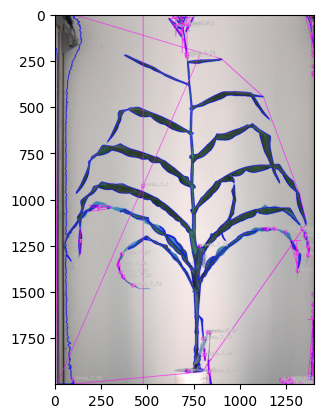

Imagen 8: 48 hojas detectadas.


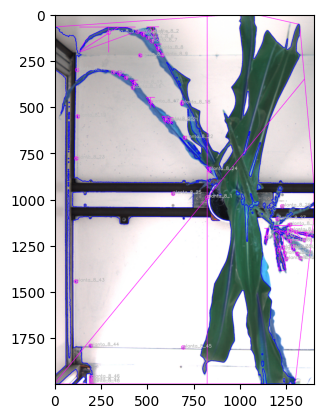


--- Proceso completado. Archivo 'analisis_maiz_detallado.csv' guardado. ---


In [ ]:
#Análisis de la morfología de la planta y hojas con convex hull
from plantcv import plantcv as pcv
import numpy as np
import pandas as pd
from skimage.io import imread

#Parametro para la visualización
pcv.params.text_size = 0.8
pcv.params.line_thickness = 2
pcv.outputs.clear()              # Limpieza de datos

print(f"Iniciando análisis multiobjeto en {len(lista_rutas_completas_imagenes)} imágenes...")

for i in range(len(lista_rutas_completas_imagenes)):
    try:
        #Preparación de la imagen y la mascara
        img_raw = imread(lista_rutas_completas_imagenes[i])
        y_min, y_max, x_min, x_max = rois_config[i]
        img_recortada = img_raw[y_min:y_max, x_min:x_max]

        # Se usa la mascara de ROI
        filtered_mask = segmentaciones_roi[i].astype(np.uint8)
        if filtered_mask.max() == 1:
            filtered_mask *= 255

        #Segmentar cada hoja como objeto único
        # Esto separa las hojas que no se tocan entre sí
        labeled_objects, num_objs = pcv.create_labels(mask=filtered_mask)
        print(f"Imagen {i+1}: {num_objs} hojas detectadas.")

        #Análisis del tamaño de los objetos
        # Genera métricas individuales para cada una de las 'num_objs' hojas
        analisis_total = pcv.analyze.size(
            img=img_recortada,
            labeled_mask=labeled_objects,
            n_labels=num_objs,
            label=f"planta_{i+1}" # Etiqueta única por imagen para el CSV
        )

        #Ploteo
        pcv.plot_image(analisis_total)

    except Exception as e:
        print(f"Error procesando imagen {i+1}: {e}")

# 6. EXPORTAR RESULTADOS FINALES
# Este archivo contendrá las áreas de cada hoja de las 8 imágenes
pcv.outputs.save_results(filename="analisis_maiz_detallado.csv", outformat="csv")
print("\n--- Proceso completado. Archivo 'analisis_maiz_detallado.csv' guardado. ---")

In [ ]:
#Descargar
import pandas as pd

#Cargar el archivo generado en el bloque anterior
df_sucio = pd.read_csv("analisis_maiz_detallado.csv")

#Limpiar los datos de corchetes y comillas para realizar una mejor lectura

def limpiar_texto(x):
    if isinstance(x, str):
        return x.replace("[", "").replace("]", "").replace("'", "")
    return x

df_limpio = df_sucio.applymap(limpiar_texto)

#Pasar las métricas a filas y columnas

df_final = df_limpio.pivot_table(
    index=['sample'],
    columns='trait',
    values='value',
    aggfunc='first'
).reset_index()

#Guardar
df_final.to_csv("datos_maiz.csv", index=False)

print("Listo para descargar datos_maiz.csv'.")
display(df_final.head())

Listo para descargar datos_maiz.csv'.


/tmp/ipykernel_9043/1696366385.py:14: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df_limpio = df_sucio.applymap(limpiar_texto)


trait,sample,area,center_of_mass,convex_hull_area,convex_hull_vertices,ellipse_angle,ellipse_center,ellipse_eccentricity,ellipse_major_axis,ellipse_minor_axis,height,in_bounds,longest_path,object_in_frame,perimeter,solidity,total_edge_length,width
0,planta_1_1,148.0,610.027027,140.0,10.0,33.645004,609.817566,0.994066,39.776123,4.326781,31.0,1.0,32.202484,1.0,77.396969,1.057143,77.396969,22.0
1,planta_1_2,31346.0,405.007848,152052.0,13.0,48.282661,-228.624695,0.865955,1779.252441,889.841736,571.0,1.0,576.066836,1.0,2882.698819,0.206153,3464.855235,515.0
2,planta_1_3,98.0,482.204082,91.0,10.0,14.781355,482.349518,0.978223,22.977316,4.769076,22.0,1.0,13.000000,1.0,50.284271,1.076923,50.284271,9.0
3,planta_1_4,37.0,331.270270,28.5,6.0,47.479416,331.405273,0.934418,10.773657,3.837356,9.0,1.0,8.544004,1.0,23.213203,1.298246,23.213203,9.0
4,planta_1_5,95.0,358.294737,86.0,9.0,105.561836,358.010162,0.964178,19.666056,5.216556,9.0,1.0,19.416488,1.0,44.627417,1.104651,44.627417,20.0


In [ ]:
#Descargar el excel
df_final.to_csv("datos_maiz.csv", index=False)
files.download("datos_maiz.csv")

print("Archivo descargado")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Archivo descargado


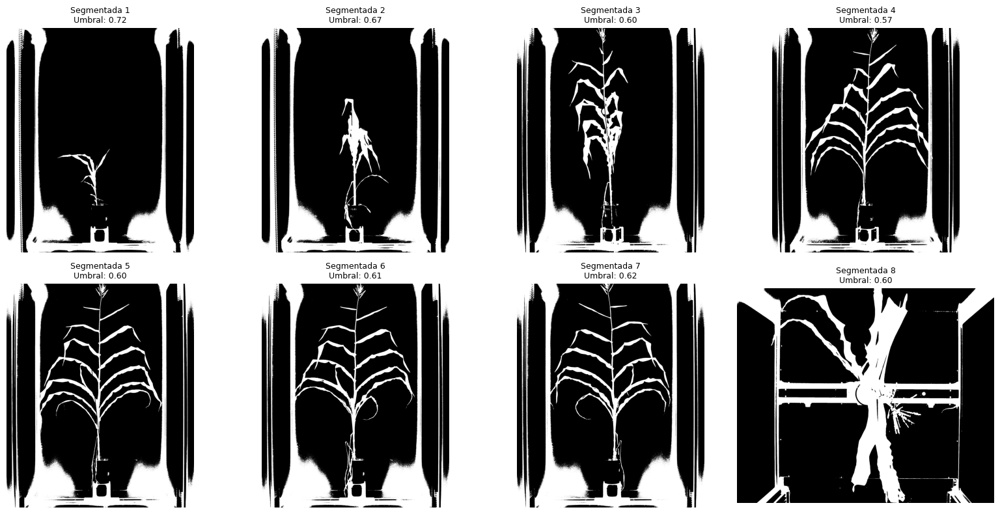

In [ ]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
from skimage.filters import threshold_otsu
from skimage.color import rgb2gray, rgba2rgb

plt.figure(figsize=(16, 8))

for i, ruta in enumerate(lista_rutas_completas_imagenes):
    if i >= 8:
        break

    img_original = mpimg.imread(ruta)

    if img_original.shape[-1] == 4:
        img_original = rgba2rgb(img_original)

    if len(img_original.shape) == 3:
        gray_image = rgb2gray(img_original)
    else:
        gray_image = img_original

    try:
        val_umbral = threshold_otsu(gray_image)
        img_segmentada = gray_image > val_umbral
    except ValueError:
        img_segmentada = gray_image

    plt.subplot(2, 4, i + 1)
    plt.imshow(~img_segmentada, cmap='gray')
    plt.title(f"Segmentada {i+1}\nUmbral: {val_umbral:.2f}", fontsize=9)
    plt.axis('off')

plt.tight_layout()
plt.show()

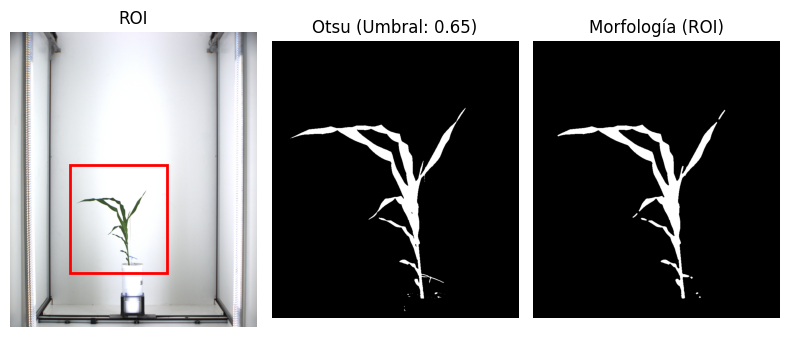

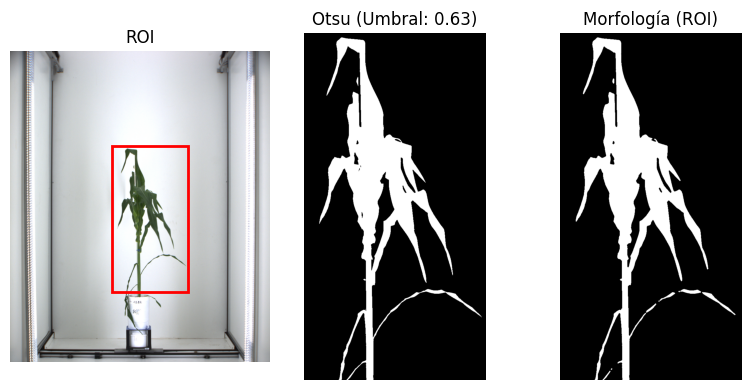

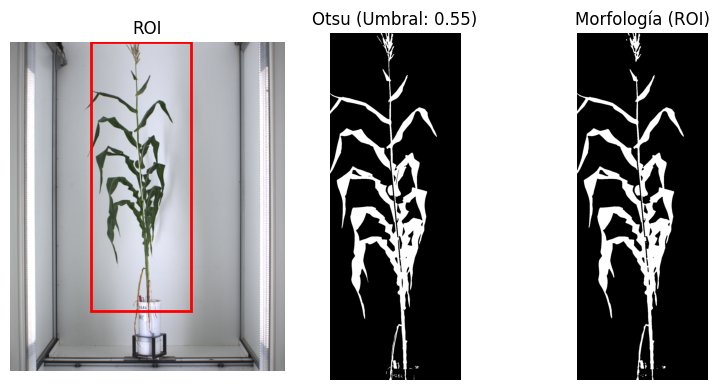

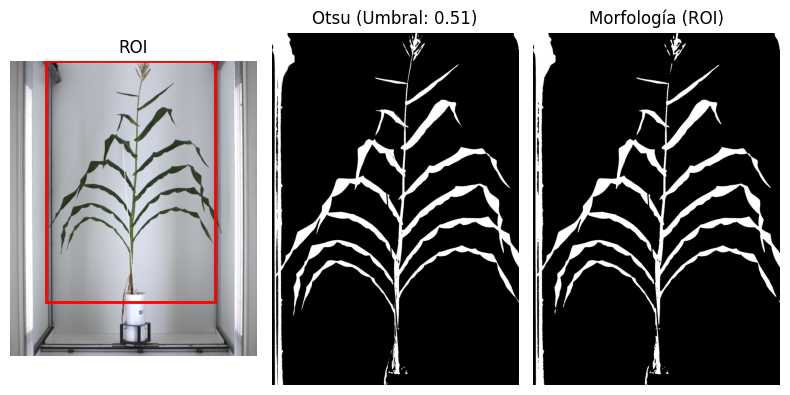

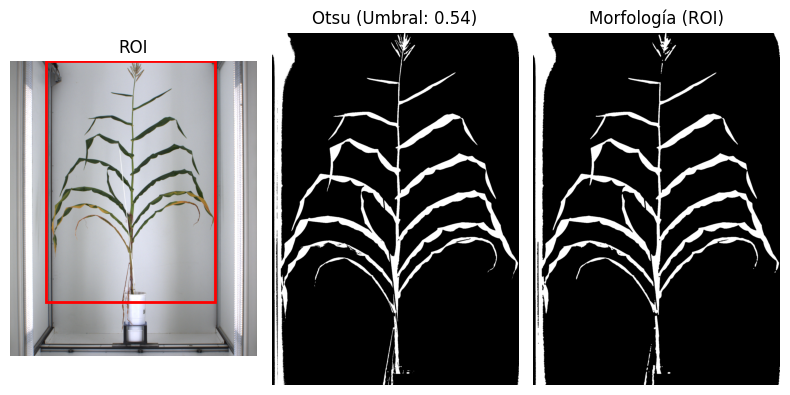

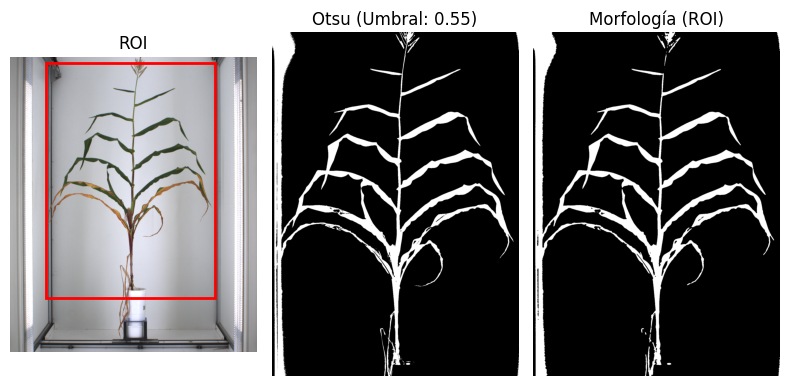

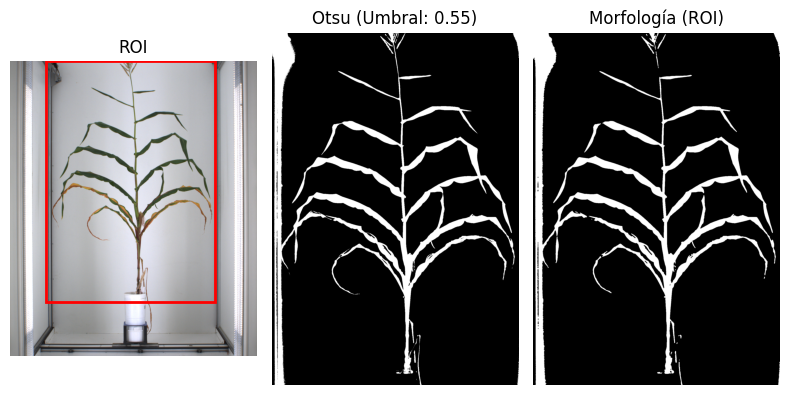

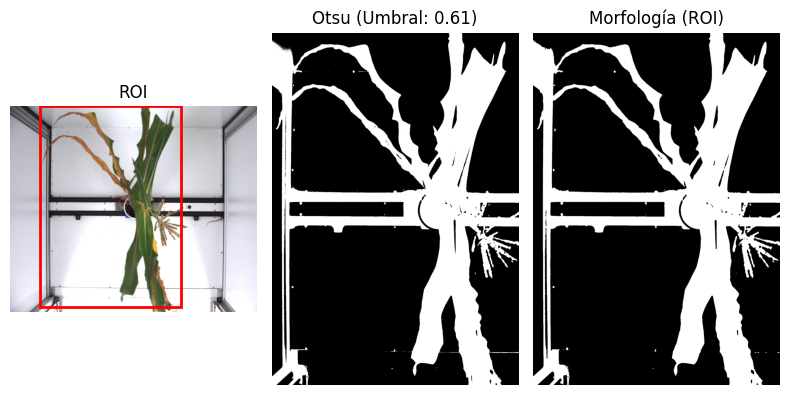

In [ ]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.image import imread
import numpy as np
from skimage.filters import threshold_otsu
from skimage.color import rgb2gray, rgba2rgb
from skimage.morphology import disk, binary_erosion, binary_dilation, binary_opening, binary_closing

# Establecimiento del ROI independiente para cada imagen
# Significado de cada numero (y_min, y_max, x_min, x_max)
rois_config = [
    (1100, 2000, 500, 1300),
    (750,  1900, 800, 1400),
    (0,    2000, 600, 1350),
    (0,    2000, 300, 1700),
    (0,    2000, 300, 1700),
    (50,   2000, 300, 1700),
    (0,    2000, 300, 1700),
    (0,    2000, 300, 1700),
    (0,    2000, 300, 1600)
]

# Inicio de la lista de ROIs
segmentaciones_roi = []

for i, ruta in enumerate(lista_rutas_completas_imagenes):
    try:
        # 1. Lectura de la imagen
        img_original = imread(ruta)

        # Convertir RGBA a RGB si es necesario
        if img_original.ndim == 3 and img_original.shape[-1] == 4:
            img_original = rgba2rgb(img_original)

        # 2. Extracción del ROI
        y_min, y_max, x_min, x_max = rois_config[i]
        img_roi = img_original[y_min:y_max, x_min:x_max]

        # 3. Conversión a escala de grises (Otsu requiere un solo canal)
        if len(img_roi.shape) == 3:
            gray_image = rgb2gray(img_roi)
        else:
            gray_image = img_roi

        # 4. Aplicación de Otsu sobre el ROI
        try:
            val_umbral = threshold_otsu(gray_image)
            img_segmentada = gray_image > val_umbral
        except ValueError:
            img_segmentada = gray_image

        # 5. Operaciones morfológicas
        elemento_estructurante = disk(2)
        erosion    = binary_erosion(img_segmentada,  elemento_estructurante)
        dilatacion = binary_dilation(erosion,         elemento_estructurante)
        apertura   = binary_opening(img_segmentada,  elemento_estructurante)
        cierre     = binary_closing(apertura,         elemento_estructurante)

        segmentaciones_roi.append(cierre)

        # 6. Visualización
        fig, axes = plt.subplots(1, 3, figsize=(8, 4))
        plt.subplots_adjust(wspace=0.05)

        # Imagen original con el ROI marcado
        axes[0].imshow(img_original)
        rect = plt.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min,
                              linewidth=2, edgecolor='r', facecolor='none')
        axes[0].add_patch(rect)
        axes[0].set_title("ROI")

        # Segmentación Otsu dentro del ROI
        axes[1].imshow(~img_segmentada, cmap='gray')
        axes[1].set_title(f"Otsu (Umbral: {val_umbral:.2f})")

        # Morfología final dentro del ROI
        axes[2].imshow(~cierre, cmap='gray')
        axes[2].set_title("Morfología (ROI)")

        for ax in axes:
            ax.axis('off')

        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"Error en imagen {i+1}: {e}")

Generando esqueletos para 8 imágenes...


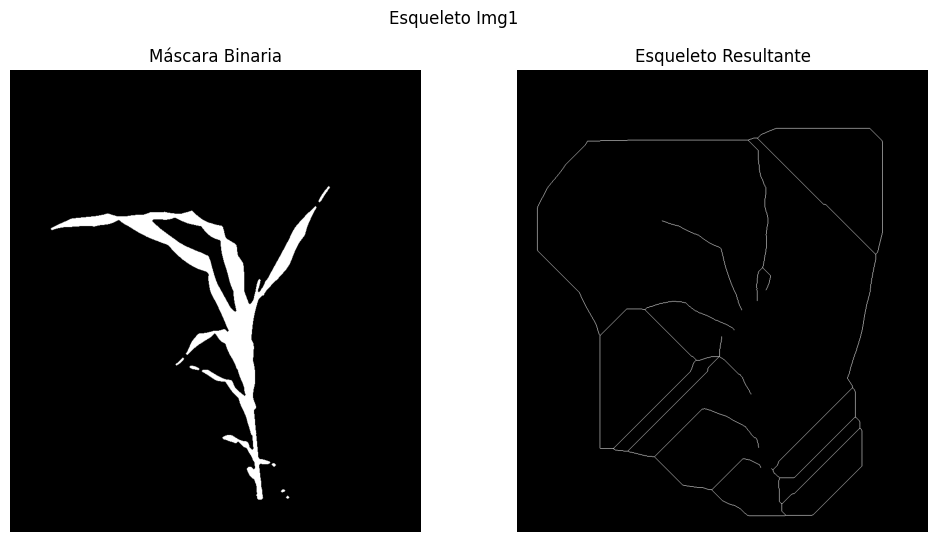

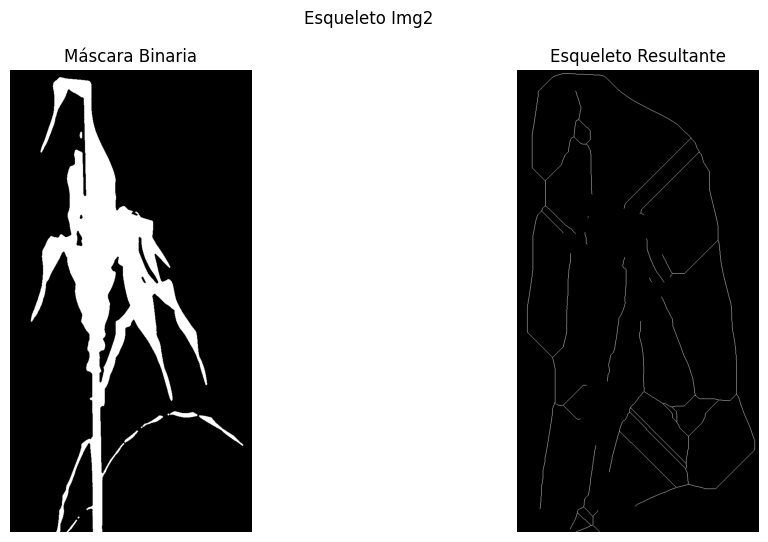

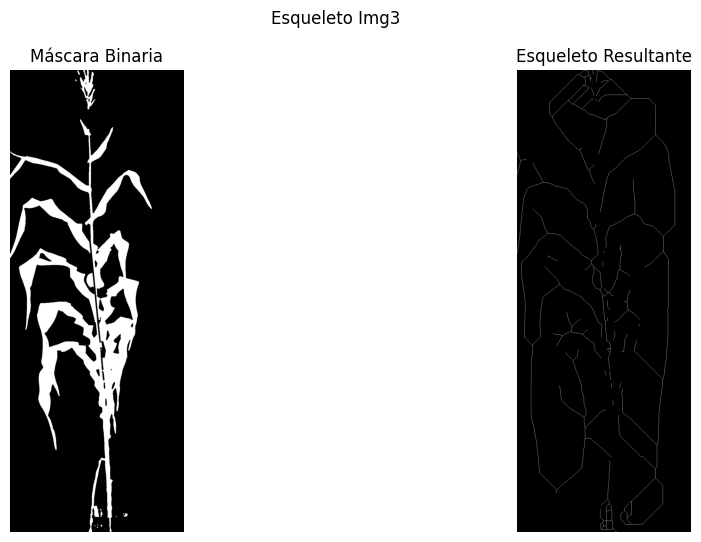

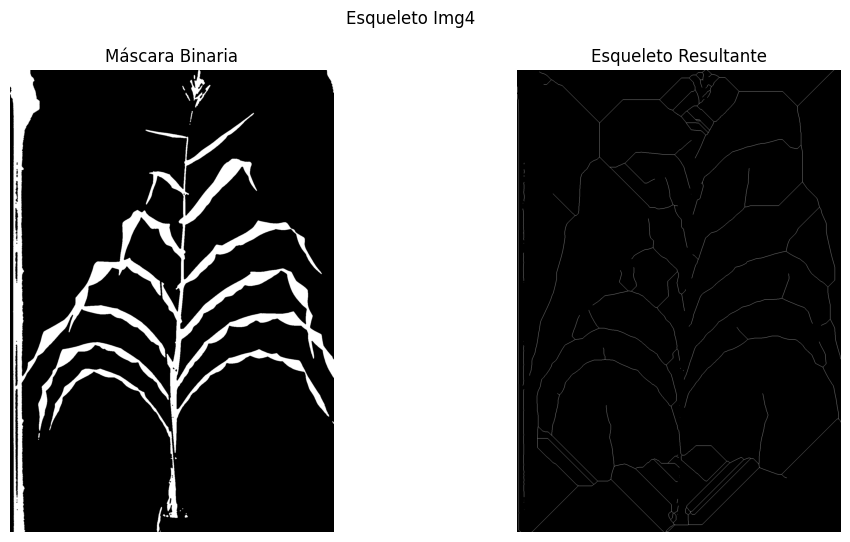

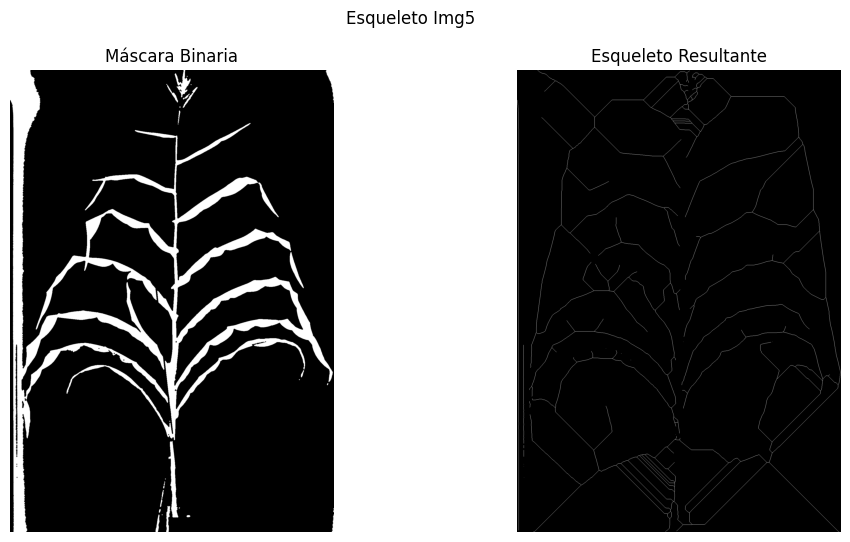

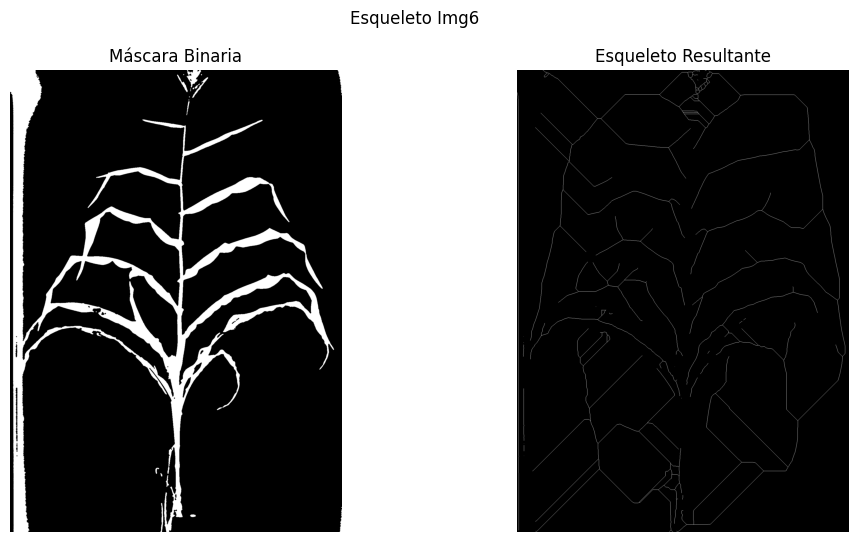

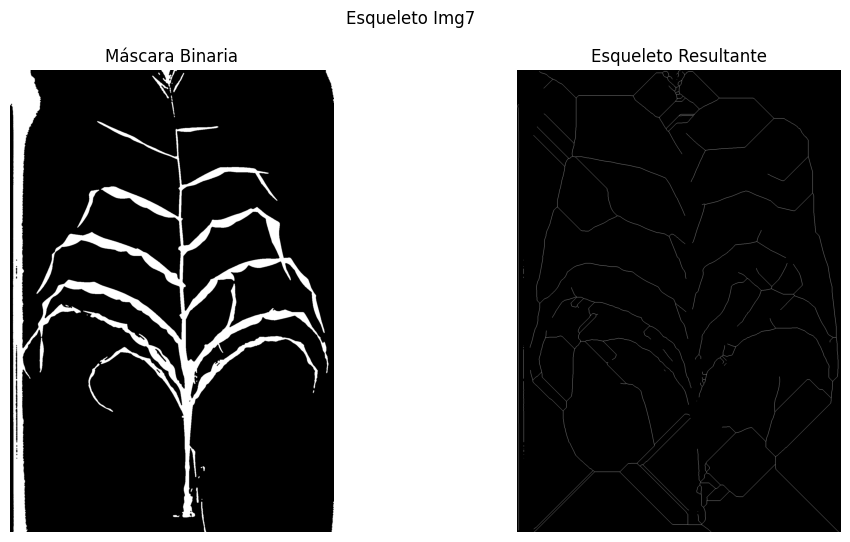

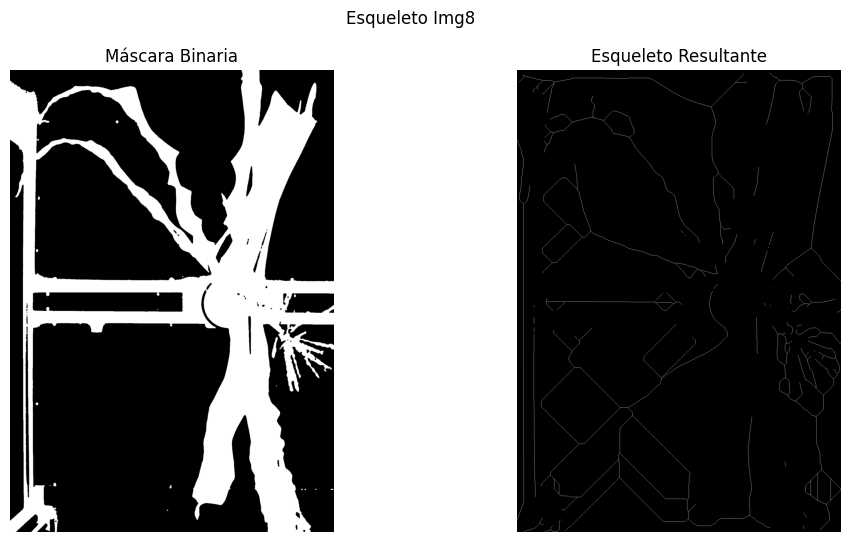

--- Proceso completado: 8 esqueletos listos ---


In [ ]:
#Generar esqueletos
from plantcv import plantcv as pcv
import matplotlib.pyplot as plt
import numpy as np

# Lista para almacenar los esqueletos resultantes
esqueletos = []

print(f"Generando esqueletos para {len(segmentaciones_roi)} imágenes...")

for i, mascara_limpia in enumerate(segmentaciones_roi):
    try:
        # PREPARACIÓN DE LA MÁSCARA
        # Converción de Booleano/Float a Entero de 8 bits (0 y 255)

        mask_for_pcv = mascara_limpia.astype(np.uint8)
        if mask_for_pcv.max() == 1:
            mask_for_pcv *= 255

        # Esqueleto
        # Esta función reduce la planta a una línea de 1 píxel de ancho
        skeleton = pcv.morphology.skeletonize(mask=mask_for_pcv)

        # Se guarda en la lista para el paso de poda del esqueleto
        esqueletos.append(skeleton)

        #Visualización
        fig, axes = plt.subplots(1, 2, figsize=(12, 6))
        fig.suptitle(f"Esqueleto Img{i+1}")

        axes[0].imshow(~mascara_limpia, cmap='gray')
        axes[0].set_title("Máscara Binaria")

        axes[1].imshow(skeleton > 0, cmap='gray')
        axes[1].set_title("Esqueleto Resultante")

        for ax in axes: ax.axis('off')
        plt.show()

    except Exception as e:
        print(f"Error al generar esqueleto en imagen {i+1}: {e}")

print(f"--- Proceso completado: {len(esqueletos)} esqueletos listos ---")

CONCLUSIONES GENERALES:

A lo largo de este notebook, se desarrolló una metodología orientada a la extracción de métricas a partir de una base de datos de imágenes de plantas de maíz. Para lograrlo, se utilizaron las herramientas vistas en clase junto con librerías adicionales como matplotlib.image, la cual fue clave para procesar cada imagen como una matriz numérica. Si bien funciones de numpy ofrecen resultados similares, optamos por esta alternativa para gestionar de manera eficiente la lectura individual de los archivos dentro de la carpeta mediante un ciclo iterativo.

Es importante señalar que, aunque el flujo de trabajo es funcional, los resultados obtenidos presentan oportunidades de mejora. La eficacia de la segmentación está estrechamente ligada a las condiciones de captura: a pesar de trabajar en un entorno controlado sin fluctuaciones de iluminación, surgieron retos técnicos debido al tamaño de las plantas en relación con el espacio reducido y su interferencia con la estructura del lugar.

Asimismo, la perspectiva de la fotografía resultó ser un factor determinante para el reconocimiento automatizado. Un claro ejemplo de esto fue la imagen 8, que al ser capturada desde un ángulo cenital (desde arriba), presentó mayores complicaciones para el procesamiento de datos en comparación con el resto de la muestra.